In [2]:
%load_ext autoreload
%autoreload 2

from tifffile import imread

from caImageAnalysis import BrukerFish, VolumeFish
from caImageAnalysis.mesm import * 
from caImageAnalysis.temporal import *
from caImageAnalysis.visualize import visualize_around_frame_multiple, visualize_images

### Change the exp_folder to the path of the experiment

In [3]:
# Change this path to the experiment folder
exp_folder = r'/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104'
region = ''

In [4]:
# Initialize the fish. 
# If custom 2P, use VolumeFish. If Bruker 2P, use BrukerFish.

# fish = VolumeFish(exp_folder)
fish = BrukerFish(exp_folder, region=region)
fish.data_paths

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

{'frametimes': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/motor_pretectum-000_frametimes.h5'),
 'raw_image': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/motor_pretectum-000_ch2.tif'),
 'raw': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/motor_pretectum-000'),
 'mesmerize': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/mesmerize-batch'),
 'temporal': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/temporal.h5'),
 'vol_temporal': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/vol_temporal.pkl'),
 'clusters': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/clusters.pkl'),
 'anatomy': None,
 'references': PosixPath('/Volumes/Rapid/DOI/Bruker/elavl3H2BGCaMP6s_11dpf_DOI_50ugml_5_20231104/motor_pretectum-000/References'),
 'voltage_output': Pos

In [4]:
# Save the final temporal responses under postgavage_path/temporal.h5
# Gives errors when you run it back to back
# If it gives an error, restart the kernel and run it again
save_temporal(fish)

Batch exists. Loading batch.pickle
finished plane 0


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:67: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices', 'pulse_frames'], dtype='object')]

  temporal_df.to_hdf(fish.exp_path.joinpath('temporal.h5'), key='temporal')
/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument '

Batch exists. Loading batch.pickle


In [5]:
# Temporal dataframe
fish.temporal_df

,plane,raw_temporal,temporal,raw_dff,roi_indices,pulse_frames,dff,norm_dff,raw_norm_dff
0,0,"[[-168.55683919862798, -94.85059649737806, -10...","[[-27.476235381662406, -27.476235381662406, -2...","[[-0.4189540918187501, -0.18207444845743134, -...","[3, 4, 5, 7, 9, 17, 18, 19, 20, 21, 23, 24, 25...",[565],"[[-2.0552402102171884e-05, -2.0552402102171884...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.03484124587706246, 0.0853509861908671, 0.0..."


In [6]:
# Plot the individual dF/F traces per plane
plane = 0

plot_temporal_plane(fish, plane, heatmap=False, key='raw_dff')

ValueError: Image size of 1000x67900 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1000x67900 with 679 Axes>

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


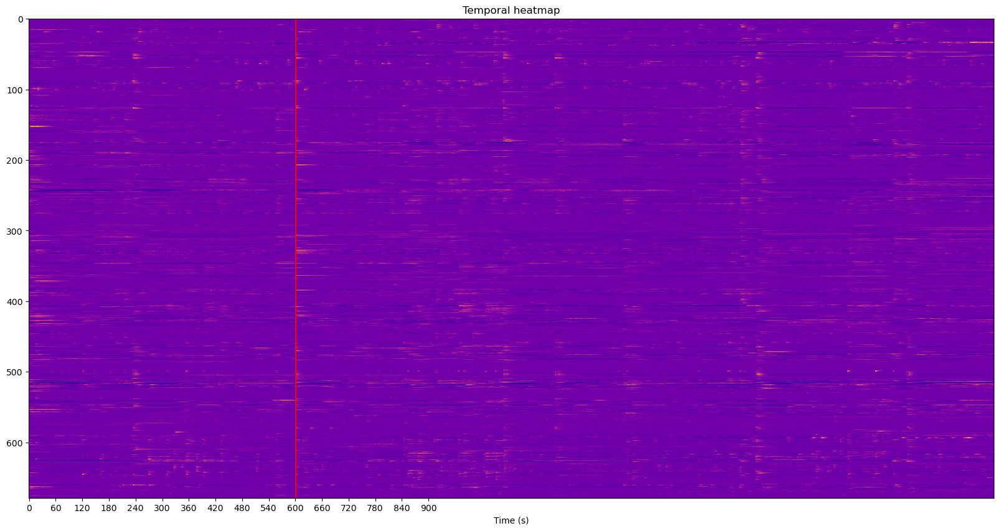

In [7]:
# Plot the individual dF/F traces of the entire volume as a heatmap
plot_temporal_volume(fish, key='raw_dff')

### Find twitch events

Batch exists. Loading batch.pickle


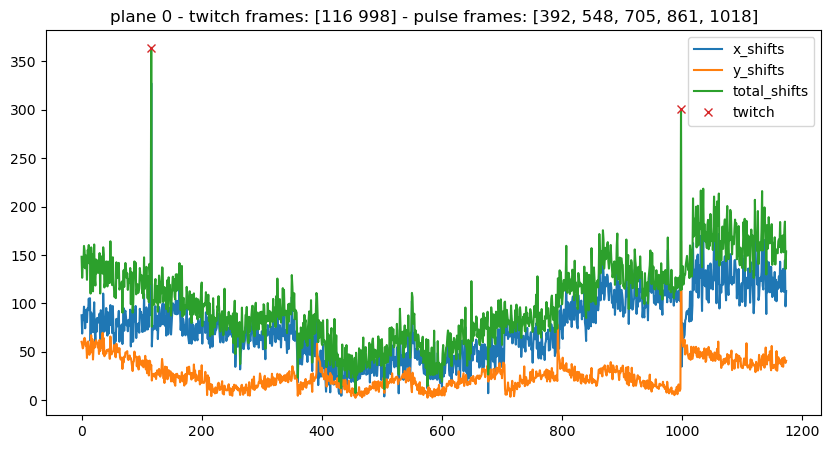

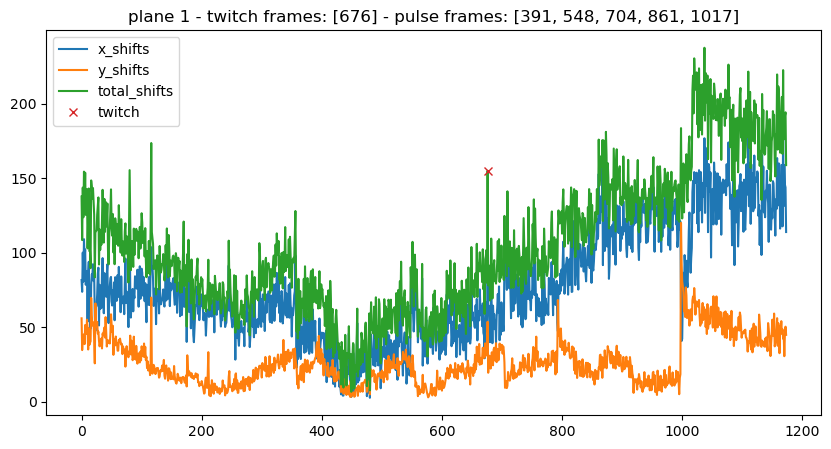

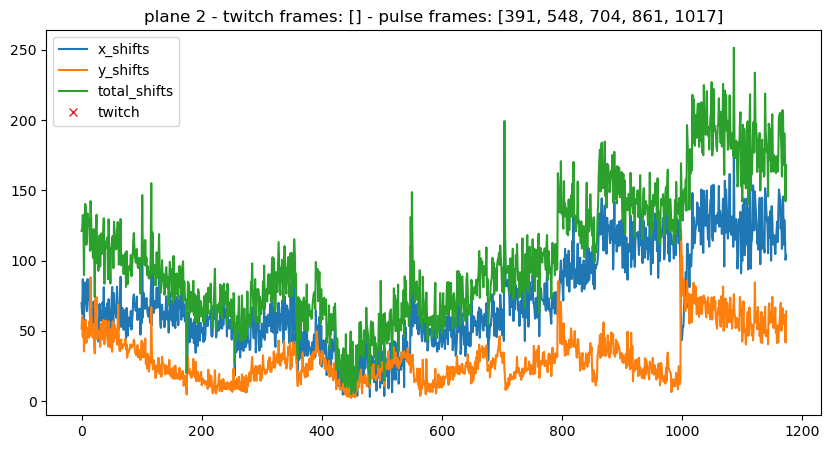

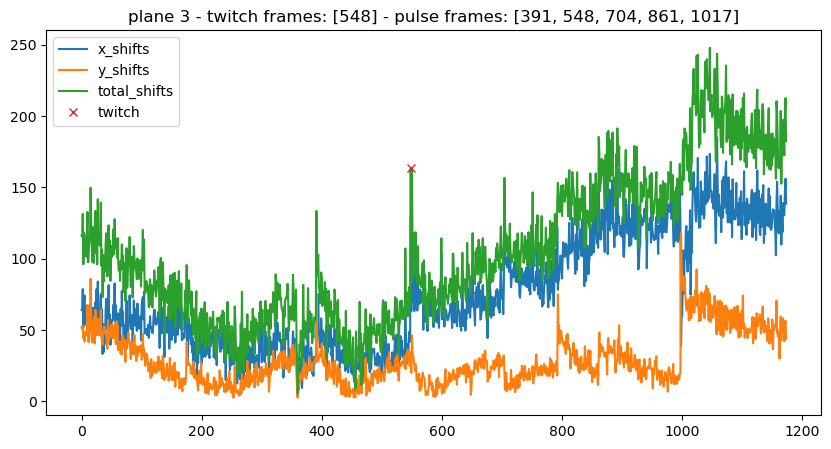

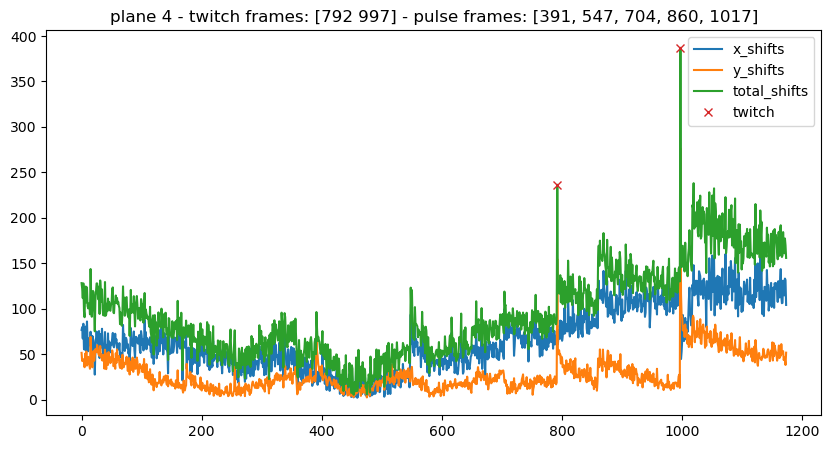

In [159]:
peaks = find_twitches(fish, plot=True, threshold=75)  # threshold: the vertical distance to its neighboring samples

In [178]:
# Confirm the twitch events
# On the ImageWidget, the twitch will occur at t=n_frames_pre
iw = visualize_around_frame_multiple(fish, peaks, n_frames_pre=3, n_frames_post=3)
iw.show()

RFBOutputContext()

In [179]:
iw.plot.canvas.close()

### Detrend dF/F on denoised data

In [8]:
# Compute the dF/F signal for each component
# Takes the F0 as the median of baseline, which is from the beginning of the recording 
# to the time before the first pulse
df = compute_median_dff(fish, window=100)
df

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:132: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices', 'pulse_frames',
       'dff'],
      dtype='object')]

  fish.temporal_df.to_hdf(fish.exp_path.joinpath('temporal.h5'), key='temporal')


,plane,raw_temporal,temporal,raw_dff,roi_indices,pulse_frames,dff
0,0,"[[-168.55683919862798, -94.85059649737806, -10...","[[-27.476235381662406, -27.476235381662406, -2...","[[-0.4189540918187501, -0.18207444845743134, -...","[3, 4, 5, 7, 9, 17, 18, 19, 20, 21, 23, 24, 25...",[565],"[[-2.0552402102171884e-05, -2.0552402102171884..."


### Normalize between 0 and 1

In [9]:
# Normalize each trace between 0 and 1
norm_df = normalize_dff(fish)
norm_df

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['norm_dff'][i] = norm_dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:155: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['raw_norm_dff'][i] = raw_norm_dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:157: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices'

,plane,raw_temporal,temporal,raw_dff,roi_indices,pulse_frames,dff,norm_dff,raw_norm_dff
0,0,"[[-168.55683919862798, -94.85059649737806, -10...","[[-27.476235381662406, -27.476235381662406, -2...","[[-0.4189540918187501, -0.18207444845743134, -...","[3, 4, 5, 7, 9, 17, 18, 19, 20, 21, 23, 24, 25...",[565],"[[-2.0552402102171884e-05, -2.0552402102171884...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.03484124587706246, 0.0853509861908671, 0.0..."


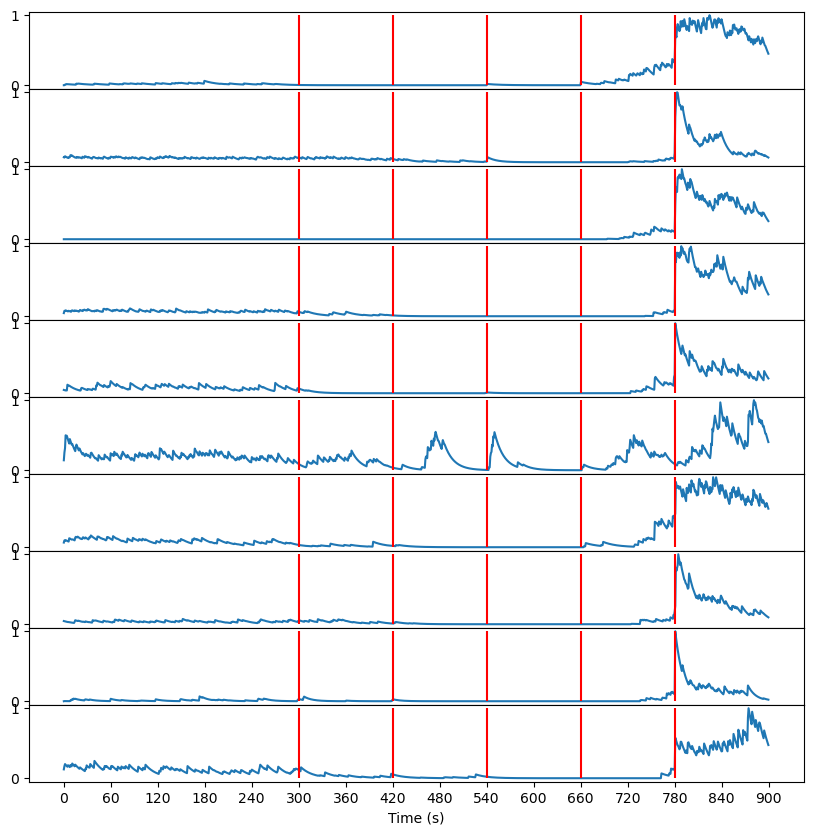

In [10]:
# Plot the individual normalized dF/F traces per plane
plane = 0

plot_temporal_plane(fish, plane, heatmap=False, key='norm_dff')

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


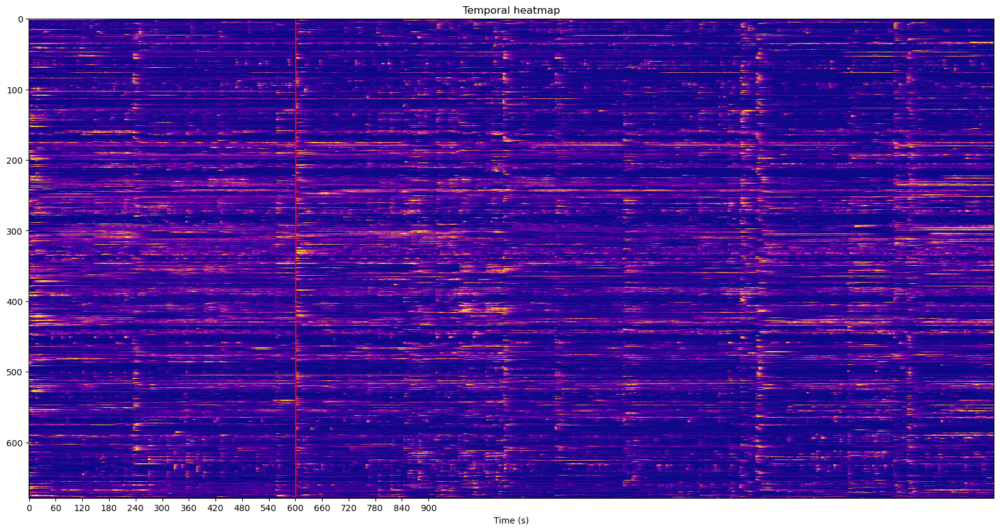

In [10]:
# Plot the individual normalized dF/F traces of the entire volume as a heatmap
plot_temporal_volume(fish, key='norm_dff')

## Cluster temporal responses

In [11]:
fish.vol_temporal.shape  # (# of components, frames)

(679, 2046)

Number of clusters: 34
Batch exists. Loading batch.pickle


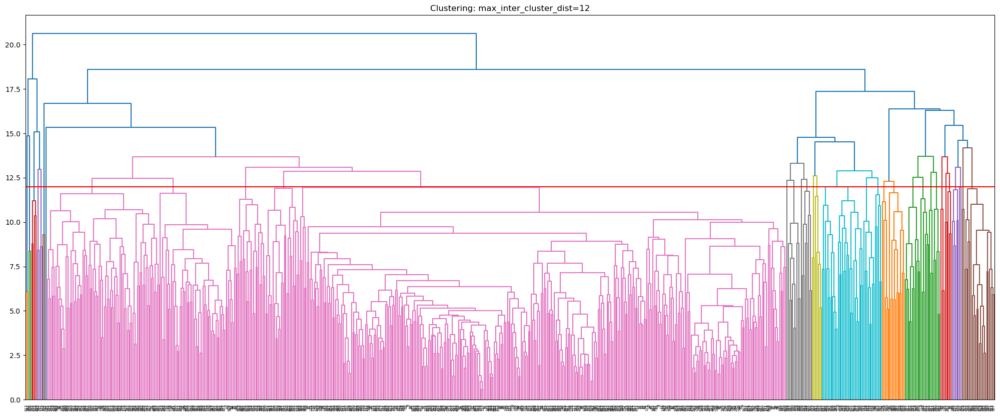

{'max_inter_cluster_dist': 12,
 'sort_inds': array([517, 547, 304, 306, 242, 516, 243, 512, 564, 429, 179, 177, 425,
        364, 209, 486, 485, 204, 599, 205, 604, 487, 214, 478, 474, 222,
        467, 226, 462, 613,  69, 461, 615, 558, 212, 200, 586, 195, 126,
        551, 563, 565, 119, 544, 568, 540, 146, 148, 197, 151, 108, 107,
        162, 163, 525, 172, 348, 508,  96, 192, 161, 618, 347, 621, 293,
        294, 300,  33, 653, 382, 656, 659, 644,  18, 322, 665, 325, 326,
        671, 354, 351, 350, 663, 409, 557, 410,  51, 250, 259, 257, 440,
        273, 255, 527, 528, 447, 327, 419, 335, 238, 363, 362, 140, 241,
        248, 556, 366, 141, 370, 433, 288, 278, 422, 199, 198, 484, 274,
        392, 368, 305, 428, 387, 269, 377, 431, 314, 372, 371, 247, 307,
        511,  68,  15, 662, 575, 603, 658, 636, 670,  64,  52,  84, 675,
         41,   1,  25,  46, 323, 391, 268, 655, 260, 646, 443, 265, 668,
        388, 343, 676, 592, 334, 445, 602, 333, 329, 481, 446, 475, 272,
       

<Figure size 640x480 with 0 Axes>

In [19]:
# Cluster the temporal responses
max_inter_cluster_dist = 12  # Set the threshold for maximum inter-cluster distance allowed

cluster_temporal(fish, max_inter_cluster_dist, sort=True, savefig=True)

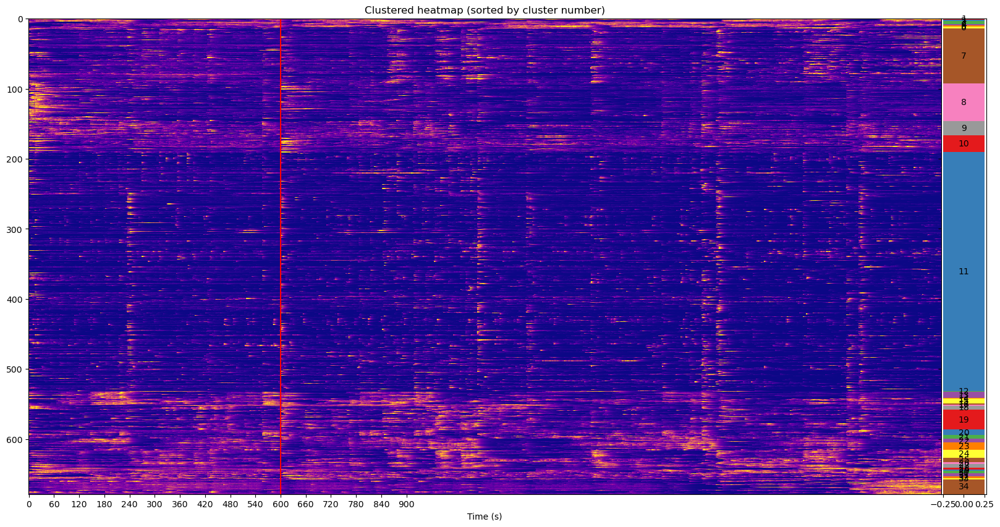

In [20]:
# Heatmap sorted by cluster number
data = fish.vol_temporal[fish.clusters['sort_inds']]
title = 'Clustered heatmap (sorted by cluster number)'
plot_temporal_volume(fish, data=data, title=title, clusters={key: fish.clusters['clusters'][key] for key in sorted(fish.clusters['clusters'])})

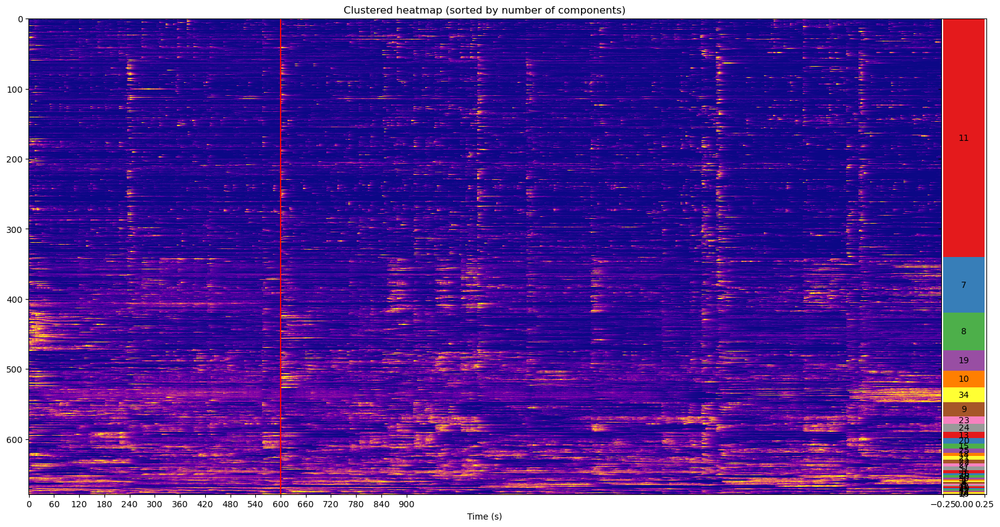

In [21]:
# Heatmap sorted by the number of components in cluster
data = sum(fish.clusters['clusters'].values(), [])
title = 'Clustered heatmap (sorted by number of components)'
plot_temporal_volume(fish, data=data, title=title, clusters=fish.clusters['clusters'])

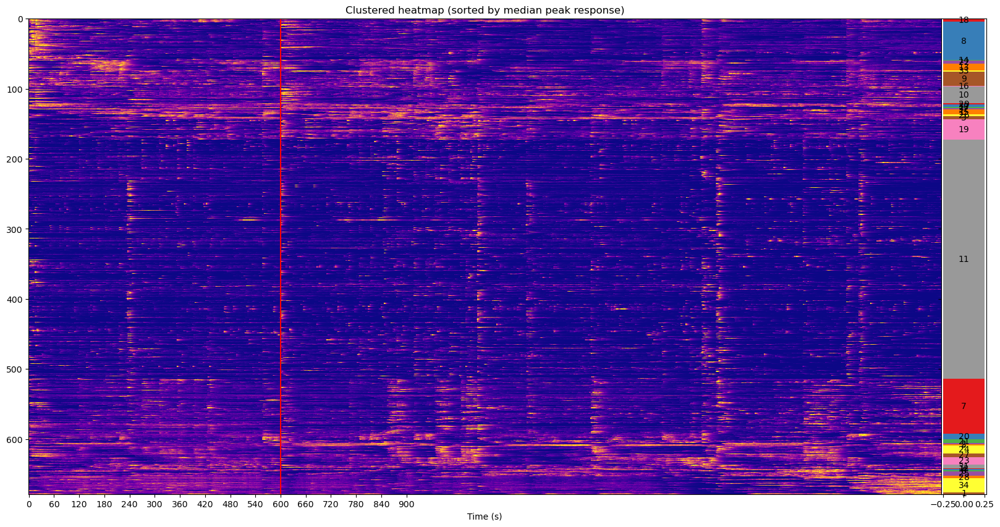

In [22]:
# Heatmap sorted by the median index of maximum peaks in a cluster
data = sum(fish.clusters['peak_clusters'].values(), [])
title = 'Clustered heatmap (sorted by median peak response)'
plot_temporal_volume(fish, data=data, title=title, clusters=fish.clusters['peak_clusters'], savefig=True)

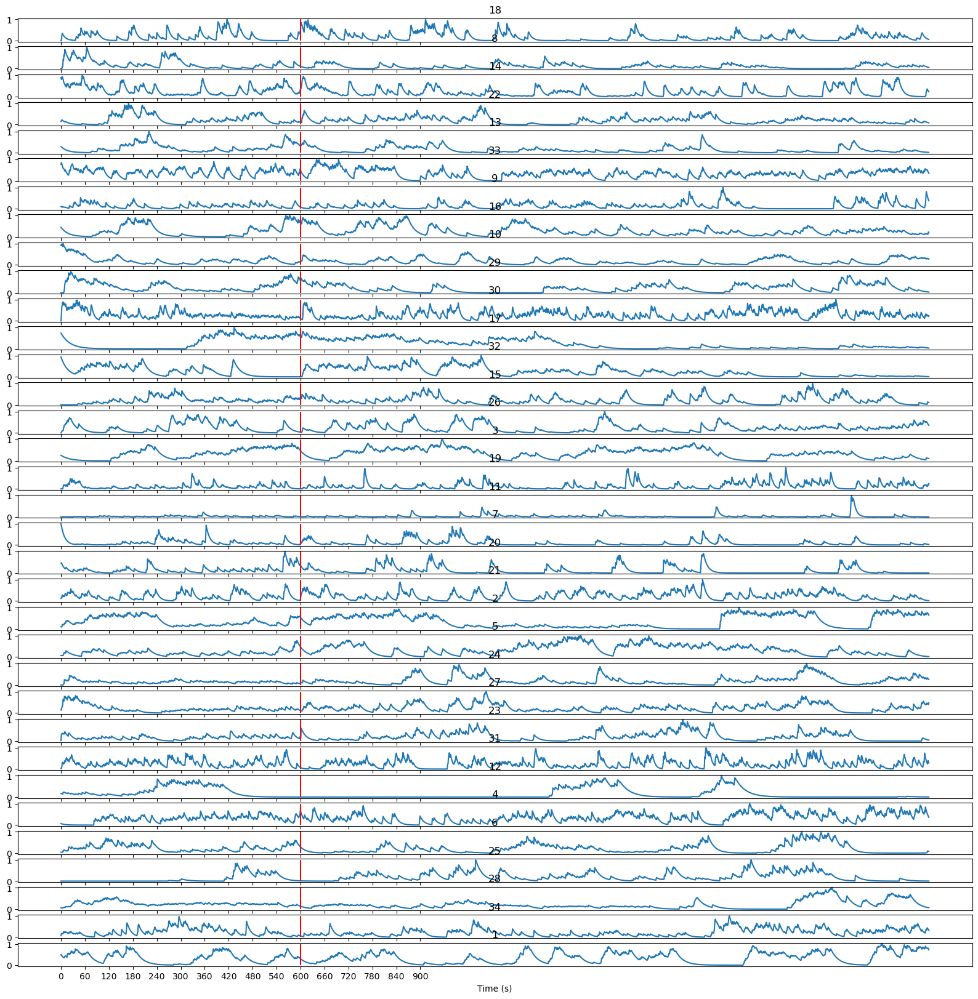

In [23]:
# Plot representative traces from each cluster
plot_representative_trace(fish, fish.clusters['peak_clusters'], savefig=True)

/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


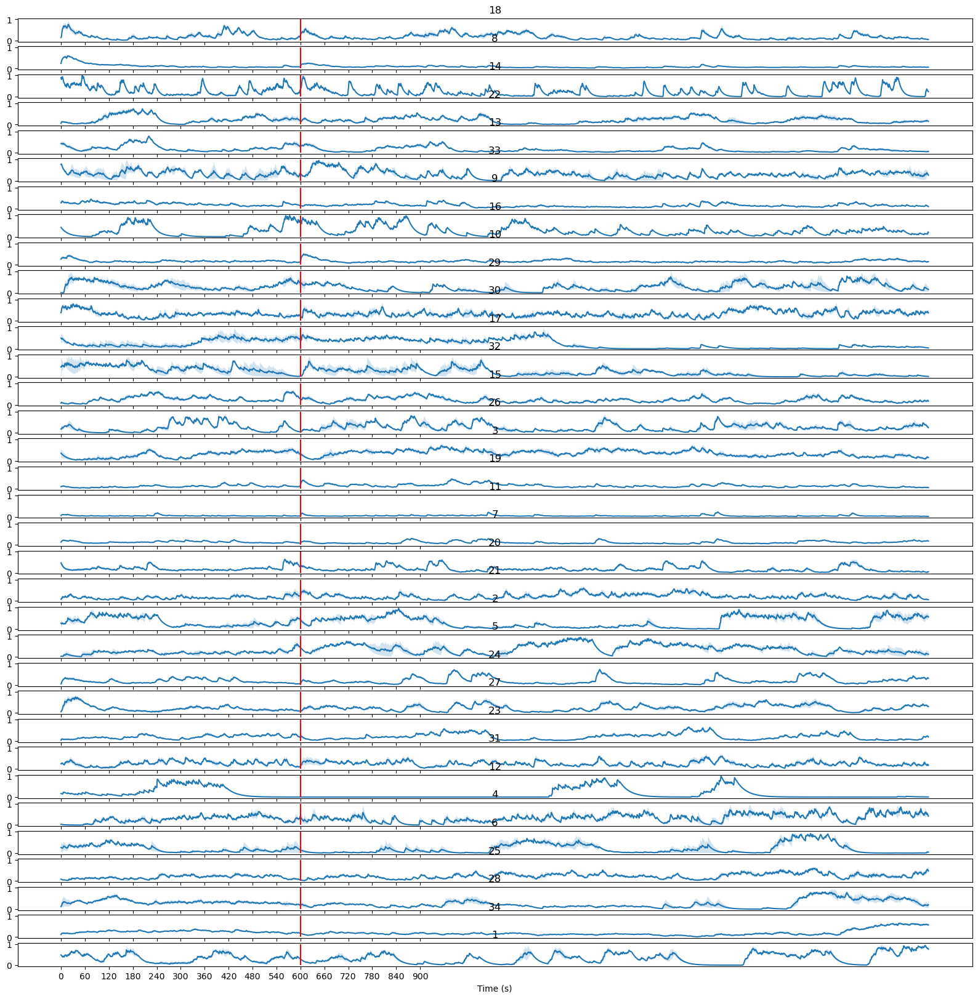

In [24]:
# Plot average traces from each cluster
plot_average_traces(fish, fish.clusters['peak_clusters'], savefig=True)

### Spatial organization of temporal clusters

In [7]:
# Visualize the anatomy stack for spatial representation
# Pick a plane to plot all spatial components on
# Also decide on a vmin-vmax value for visualization
try:
    anatomy_img = imread(fish.data_paths['anatomy'])
except ValueError:
    # if there are no anatomy images
    plane = 0
    img = imread(fish.data_paths['volumes'][str(plane)]['image'])
    anatomy_img = img[:16, :, :]

iw = visualize_images(anatomy_img)
iw.show()

RFBOutputContext()

No such comm: cd76277da722477d9bb3a29be89d72ec
No such comm: cd76277da722477d9bb3a29be89d72ec


In [8]:
iw.plot.canvas.close()

In [9]:
# Using the t above, set an index for the background anatomy image
index = 0

# Using the min-max above, set vmin and vmax values for better visualization of the image
vmin = 0
vmax = 282

img = anatomy_img[index]

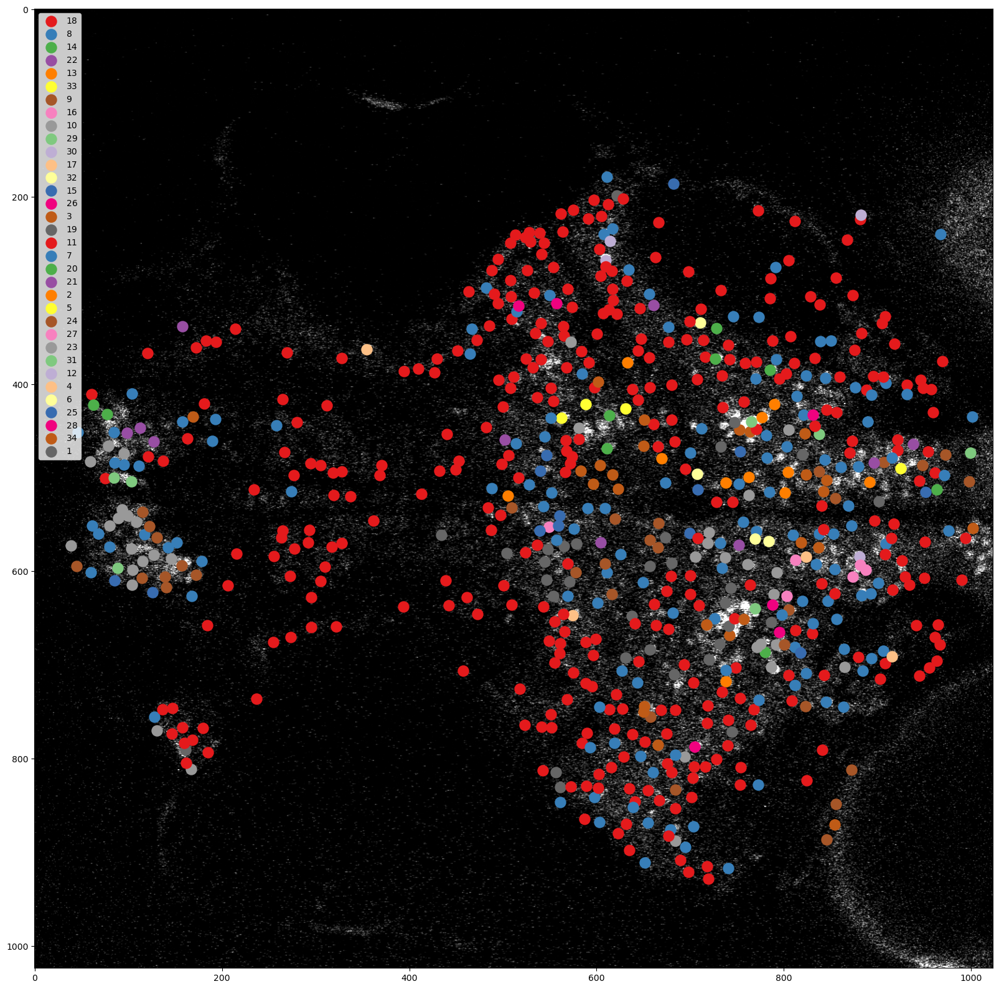

In [25]:
# Plot all components, color coded based on their cluster number
plot_spatial_overlayed(fish, img, vmin=vmin, vmax=vmax, savefig=True)

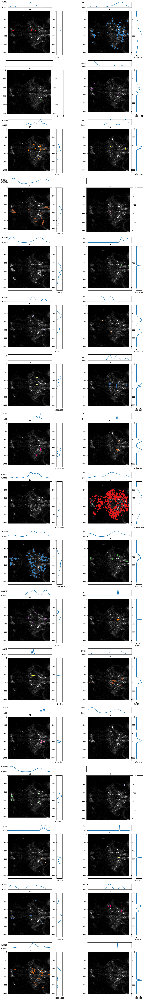

In [27]:
# Plot individual clusters on separately
plot_spatial_individual(fish, img, vmin=vmin, vmax=vmax, distribution=True, savefig=True)

neuron 2 is activated
neuron 2 responds to stimulus 1 (activated)
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 3 (activated)
neuron 2 responds to stimulus 5 (activated)
neuron 2 responds to 80.0% of injections

neuron 24 is activated
neuron 24 responds to stimulus 1 (activated)
neuron 24 responds to stimulus 2 (activated)
neuron 24 responds to stimulus 3 (activated)
neuron 24 responds to stimulus 5 (activated)
neuron 24 responds to 80.0% of injections

2 out of 25 neurons is stimulus responsive: 8.0%


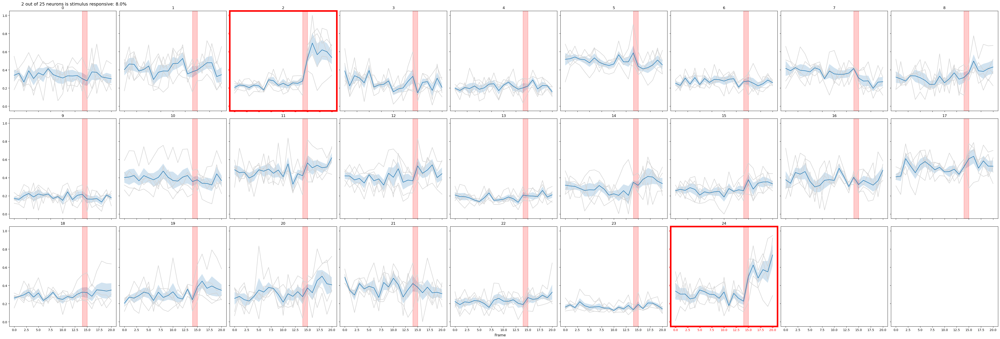

In [40]:
plot_neuron_pulse_average(fish, pre_frame_num=15, post_frame_num=5, peak_threshold=0.4, savefig=True, n_cols=9, baseline_threshold=1)

## Stytra alignment

In [41]:
import json
with os.scandir(fish.data_paths['stytra']) as entries:
    for entry in entries:
        if 'behavior_log.csv' in entry.name and not entry.name.startswith('.'):
            tracking_df = pd.read_csv(entry.path, sep=';', index_col=0)
        elif 'metadata.json' in entry.name and not entry.name.startswith('.'):
            f = open(entry.path)
            metadata = json.load(f)

In [35]:
tracking_df

,tail_sum,theta_00,theta_01,theta_02,theta_03,theta_04,theta_05,t
0,-0.006525,0.001627,0.001884,0.001653,0.000448,-0.000842,-0.002173,-0.001488
1,-0.005945,0.003681,0.001151,-0.000428,-0.000105,-0.000317,-0.000797,0.008432
2,-0.006683,0.002987,0.001577,0.000512,0.000136,-0.000601,-0.001518,0.018352
3,-0.005741,0.002261,0.001476,0.000988,0.001094,-0.000089,-0.001915,0.028272
4,-0.008846,0.004588,0.001229,-0.000580,0.000711,-0.000376,-0.002652,0.038688
...,...,...,...,...,...,...,...,...
89969,-0.004821,0.002227,0.001307,0.000539,0.000072,-0.000403,-0.000884,899.951925
89970,-0.004817,0.000897,0.002011,0.002107,0.000167,-0.000751,-0.001159,899.961844
89971,-0.004698,0.001859,0.001963,0.001470,-0.000215,-0.000584,-0.000293,899.971764
89972,-0.004090,0.000987,0.002316,0.002221,-0.000724,-0.000955,0.000170,899.981684


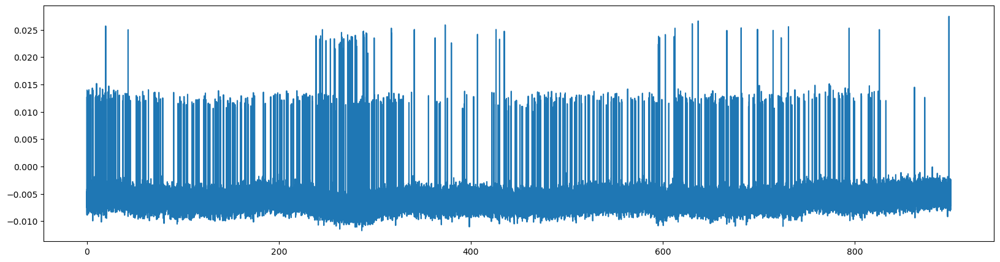

In [37]:
fig = plt.figure(figsize=(20, 5))
plt.plot(tracking_df['t'], tracking_df['tail_sum'])

'2023-09-13T17:46:53.684652'